# Monza Circuit: F1 Stats and Record

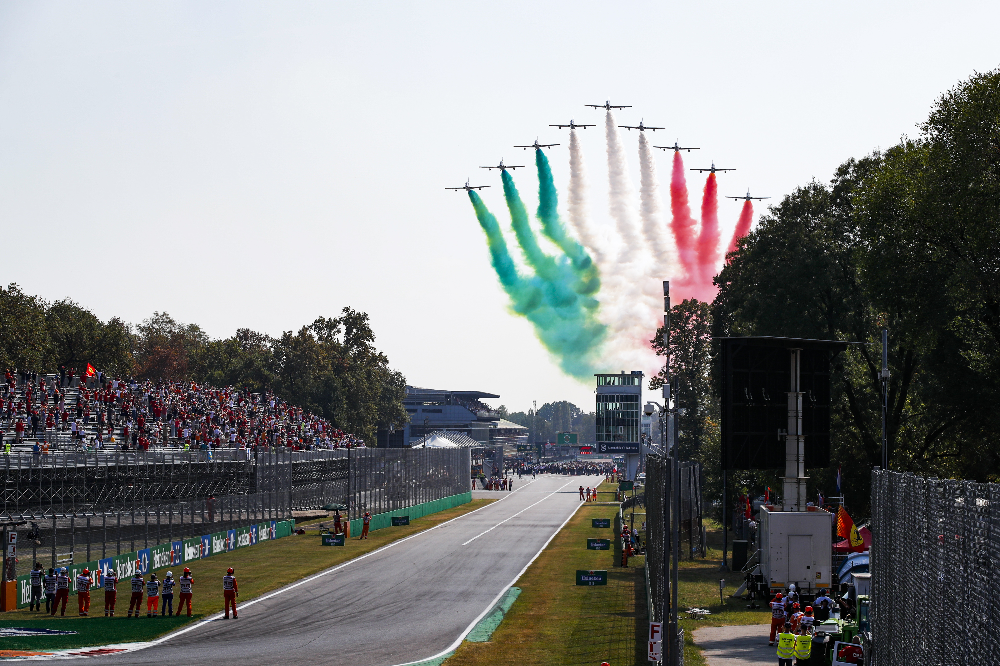

Monza Circuit also known as Temple of Speed is a race track near the city of Monza, north of Milan, in Italy. Constructed in just 110 days in 1922, the Autodromo Nazionale Monza was the world’s third purpose-built race track, coming after Brooklands in the UK and Indianapolis in the US. Like those two tracks, the original circuit featured a daunting series of banked curves, as well as much of the ‘outfield’ section that’s still in use today.

Stats:

- First Grand Prix : 1950 
- Circuit length : 5.793 km 
- Number of laps : 53
- Race distance : 306.720 km


In [2]:
%%html
<style>
@font-face {
  font-family: F1;
  src: url(https://www.formula1.com/etc/designs/fom-website/fonts/F1Regular/Formula1-Regular.ttf);
}

span{
  font-family: F1;
}

a{
  font-family: F1;
}

.nav-pills>li.active>a:focus {
    color: #ffffff;
    background-color: lightgray;
}

.container-fluid, .container-fluid h1 {
    font-family: F1;
    line-height: 1.7;
}

.container-fluid p {
    font-family: F1;
    color:black;
}

h1,h2,h3,h4,h5,h6,p, table {
  font-family: F1;
  color: black
}
</style>



In [3]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import warnings
warnings.simplefilter("ignore")
pd.set_option('display.max_columns', None)

In [4]:
import time
import datetime
import scipy.stats as sp

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [5]:
result_df = pd.read_csv("C:\\Users\\bassa\\Downloads\\archive (1)\\results.csv")
stats_df = pd.read_csv("C:\\Users\\bassa\\Downloads\\archive (1)\\status.csv")
drivers_df = pd.read_csv("C:\\Users\\bassa\\Downloads\\archive (1)\\drivers.csv")
races_df = pd.read_csv("C:\\Users\\bassa\\Downloads\\archive (1)\\races.csv")
constructor_df = pd.read_csv("C:\\Users\\bassa\\Downloads\\archive (1)\\constructors.csv")
driver_standings_df = pd.read_csv("C:\\Users\\bassa\\Downloads\\archive (1)\\driver_standings.csv")
circuits_df = pd.read_csv("C:\\Users\\bassa\\Downloads\\archive (1)\\circuits.csv")
pd.get_option("display.max_columns",None)

In [6]:
result_df.head()

,resultId,raceId,driverId,constructorId,number,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId
0,1,18,1,1,22,1,1,1,1,10.0,58,1:34:50.616,5690616,39,2,1:27.452,218.300,1
1,2,18,2,2,3,5,2,2,2,8.0,58,+5.478,5696094,41,3,1:27.739,217.586,1
2,3,18,3,3,7,7,3,3,3,6.0,58,+8.163,5698779,41,5,1:28.090,216.719,1
3,4,18,4,4,5,11,4,4,4,5.0,58,+17.181,5707797,58,7,1:28.603,215.464,1
4,5,18,5,1,23,3,5,5,5,4.0,58,+18.014,5708630,43,1,1:27.418,218.385,1


In [7]:
stats_df.head()

,statusId,status
0,1,Finished
1,2,Disqualified
2,3,Accident
3,4,Collision
4,5,Engine


In [8]:
drivers_df.head()

,driverId,driverRef,number,code,forename,surname,dob,nationality,url
0,1,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton
1,2,heidfeld,\N,HEI,Nick,Heidfeld,1977-05-10,German,http://en.wikipedia.org/wiki/Nick_Heidfeld
2,3,rosberg,6,ROS,Nico,Rosberg,1985-06-27,German,http://en.wikipedia.org/wiki/Nico_Rosberg
3,4,alonso,14,ALO,Fernando,Alonso,1981-07-29,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso
4,5,kovalainen,\N,KOV,Heikki,Kovalainen,1981-10-19,Finnish,http://en.wikipedia.org/wiki/Heikki_Kovalainen


In [9]:
races_df.head()

,raceId,year,round,circuitId,name,date,time,url,fp1_date,fp1_time,fp2_date,fp2_time,fp3_date,fp3_time,quali_date,quali_time,sprint_date,sprint_time
0,1,2009,1,1,Australian Grand Prix,2009-03-29,06:00:00,http://en.wikipedia.org/wiki/2009_Australian_G...,\N,\N,\N,\N,\N,\N,\N,\N,\N,\N
1,2,2009,2,2,Malaysian Grand Prix,2009-04-05,09:00:00,http://en.wikipedia.org/wiki/2009_Malaysian_Gr...,\N,\N,\N,\N,\N,\N,\N,\N,\N,\N
2,3,2009,3,17,Chinese Grand Prix,2009-04-19,07:00:00,http://en.wikipedia.org/wiki/2009_Chinese_Gran...,\N,\N,\N,\N,\N,\N,\N,\N,\N,\N
3,4,2009,4,3,Bahrain Grand Prix,2009-04-26,12:00:00,http://en.wikipedia.org/wiki/2009_Bahrain_Gran...,\N,\N,\N,\N,\N,\N,\N,\N,\N,\N
4,5,2009,5,4,Spanish Grand Prix,2009-05-10,12:00:00,http://en.wikipedia.org/wiki/2009_Spanish_Gran...,\N,\N,\N,\N,\N,\N,\N,\N,\N,\N


In [10]:
constructor_df.head()

,constructorId,constructorRef,name,nationality,url
0,1,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
1,2,bmw_sauber,BMW Sauber,German,http://en.wikipedia.org/wiki/BMW_Sauber
2,3,williams,Williams,British,http://en.wikipedia.org/wiki/Williams_Grand_Pr...
3,4,renault,Renault,French,http://en.wikipedia.org/wiki/Renault_in_Formul...
4,5,toro_rosso,Toro Rosso,Italian,http://en.wikipedia.org/wiki/Scuderia_Toro_Rosso


In [11]:
driver_standings_df.head()

,driverStandingsId,raceId,driverId,points,position,positionText,wins
0,1,18,1,10.0,1,1,1
1,2,18,2,8.0,2,2,0
2,3,18,3,6.0,3,3,0
3,4,18,4,5.0,4,4,0
4,5,18,5,4.0,5,5,0


In [12]:
ind = circuits_df[circuits_df['country'] == 'Italy']
ind

,circuitId,circuitRef,name,location,country,lat,lng,alt,url
13,14,monza,Autodromo Nazionale di Monza,Monza,Italy,45.6156,9.28111,162,http://en.wikipedia.org/wiki/Autodromo_Naziona...
20,21,imola,Autodromo Enzo e Dino Ferrari,Imola,Italy,44.3439,11.71670,37,http://en.wikipedia.org/wiki/Autodromo_Enzo_e_...
64,65,pescara,Pescara Circuit,Pescara,Italy,42.4750,14.15080,129,http://en.wikipedia.org/wiki/Pescara_Circuit
73,76,mugello,Autodromo Internazionale del Mugello,Mugello,Italy,43.9975,11.37190,255,http://en.wikipedia.org/wiki/Mugello_Circuit


In [13]:
track = circuits_df[circuits_df['circuitRef'] == 'monza']
track_lat = track['lat'].values[0]
track_lng = track['lng'].values[0]

In [14]:
fig = px.scatter_mapbox(track, lat='lat', lon='lng',
                        color_discrete_sequence=["fuchsia"], zoom=12, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [15]:
concat_driver_name = lambda x: f"{x.forename} {x.surname}" 

drivers_df['driver'] = drivers_df.apply(concat_driver_name, axis=1)

In [16]:
drivers_df.head()

,driverId,driverRef,number,code,forename,surname,dob,nationality,url,driver
0,1,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,Lewis Hamilton
1,2,heidfeld,\N,HEI,Nick,Heidfeld,1977-05-10,German,http://en.wikipedia.org/wiki/Nick_Heidfeld,Nick Heidfeld
2,3,rosberg,6,ROS,Nico,Rosberg,1985-06-27,German,http://en.wikipedia.org/wiki/Nico_Rosberg,Nico Rosberg
3,4,alonso,14,ALO,Fernando,Alonso,1981-07-29,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso,Fernando Alonso
4,5,kovalainen,\N,KOV,Heikki,Kovalainen,1981-10-19,Finnish,http://en.wikipedia.org/wiki/Heikki_Kovalainen,Heikki Kovalainen


In [17]:
result = pd.merge(result_df,drivers_df,on = 'driverId')
result.head()

,resultId,raceId,driverId,constructorId,number_x,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId,driverRef,number_y,code,forename,surname,dob,nationality,url,driver
0,1,18,1,1,22,1,1,1,1,10.0,58,1:34:50.616,5690616,39,2,1:27.452,218.300,1,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,Lewis Hamilton
1,27,19,1,1,22,9,5,5,5,4.0,56,+46.548,5525103,53,3,1:35.462,209.033,1,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,Lewis Hamilton
2,57,20,1,1,22,3,13,13,13,0.0,56,\N,\N,25,19,1:35.520,203.969,11,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,Lewis Hamilton
3,69,21,1,1,22,5,3,3,3,6.0,66,+4.187,5903238,20,3,1:22.017,204.323,1,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,Lewis Hamilton
4,90,22,1,1,22,3,2,2,2,8.0,58,+3.779,5213230,31,2,1:26.529,222.085,1,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,Lewis Hamilton


In [18]:
races_df[['circuitId','raceId']]

,circuitId,raceId
0,1,1
1,2,2
2,17,3
3,3,4
4,4,5
...,...,...
1097,69,1116
1098,32,1117
1099,18,1118
1100,80,1119


In [19]:
result = pd.merge(result,races_df[['circuitId','raceId']],on = 'raceId')
result.head()

,resultId,raceId,driverId,constructorId,number_x,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId,driverRef,number_y,code,forename,surname,dob,nationality,url,driver,circuitId
0,1,18,1,1,22,1,1,1,1,10.0,58,1:34:50.616,5690616,39,2,1:27.452,218.300,1,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,Lewis Hamilton,1
1,2,18,2,2,3,5,2,2,2,8.0,58,+5.478,5696094,41,3,1:27.739,217.586,1,heidfeld,\N,HEI,Nick,Heidfeld,1977-05-10,German,http://en.wikipedia.org/wiki/Nick_Heidfeld,Nick Heidfeld,1
2,3,18,3,3,7,7,3,3,3,6.0,58,+8.163,5698779,41,5,1:28.090,216.719,1,rosberg,6,ROS,Nico,Rosberg,1985-06-27,German,http://en.wikipedia.org/wiki/Nico_Rosberg,Nico Rosberg,1
3,4,18,4,4,5,11,4,4,4,5.0,58,+17.181,5707797,58,7,1:28.603,215.464,1,alonso,14,ALO,Fernando,Alonso,1981-07-29,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso,Fernando Alonso,1
4,5,18,5,1,23,3,5,5,5,4.0,58,+18.014,5708630,43,1,1:27.418,218.385,1,kovalainen,\N,KOV,Heikki,Kovalainen,1981-10-19,Finnish,http://en.wikipedia.org/wiki/Heikki_Kovalainen,Heikki Kovalainen,1


In [20]:
result = result[result['position'] != '\\N'].copy()
race_monza_df = result[result['circuitId'] == 14]
race_monza_df['position'] = race_monza_df['position'].astype(int)
race_monza_df = pd.merge(race_monza_df,constructor_df,on = 'constructorId')
race_monza_df.head()

,resultId,raceId,driverId,constructorId,number_x,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId,driverRef,number_y,code,forename,surname,dob,nationality_x,url_x,driver,circuitId,constructorRef,name,nationality_y,url_y
0,275,31,1,1,22,15,7,7,7,2.0,53,+29.912,5237406,52,5,1:29.721,232.440,1,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,Lewis Hamilton,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
1,270,31,5,1,23,2,2,2,2,8.0,53,+12.512,5220006,53,13,1:30.300,230.950,1,kovalainen,\N,KOV,Heikki,Kovalainen,1981-10-19,Finnish,http://en.wikipedia.org/wiki/Heikki_Kovalainen,Heikki Kovalainen,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
2,634,48,1,1,2,2,2,2,2,8.0,53,+6.062,4723868,17,2,1:22.936,251.456,1,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,Lewis Hamilton,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
3,633,48,4,1,1,1,1,1,1,10.0,53,1:18:37.806,4717806,15,1,1:22.871,251.653,1,alonso,14,ALO,Fernando,Alonso,1981-07-29,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso,Fernando Alonso,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
4,7805,13,1,1,1,1,12,12,12,0.0,52,\N,\N,52,3,1:24.802,245.923,3,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,Lewis Hamilton,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren


In [21]:
race_monza_df.sort_values(by=['resultId']).head()

,resultId,raceId,driverId,constructorId,number_x,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId,driverRef,number_y,code,forename,surname,dob,nationality_x,url_x,driver,circuitId,constructorRef,name,nationality_y,url_y
181,269,31,20,5,15,1,1,1,1,10.0,53,1:26:47.494,5207494,53,14,1:30.510,230.414,1,vettel,5,VET,Sebastian,Vettel,1987-07-03,German,http://en.wikipedia.org/wiki/Sebastian_Vettel,Sebastian Vettel,14,toro_rosso,Toro Rosso,Italian,http://en.wikipedia.org/wiki/Scuderia_Toro_Rosso
1,270,31,5,1,23,2,2,2,2,8.0,53,+12.512,5220006,53,13,1:30.300,230.950,1,kovalainen,\N,KOV,Heikki,Kovalainen,1981-10-19,Finnish,http://en.wikipedia.org/wiki/Heikki_Kovalainen,Heikki Kovalainen,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
73,271,31,9,2,4,11,3,3,3,6.0,53,+20.471,5227965,52,12,1:30.298,230.955,1,kubica,88,KUB,Robert,Kubica,1984-12-07,Polish,http://en.wikipedia.org/wiki/Robert_Kubica,Robert Kubica,14,bmw_sauber,BMW Sauber,German,http://en.wikipedia.org/wiki/BMW_Sauber
151,272,31,4,4,5,8,4,4,4,5.0,53,+23.903,5231397,51,9,1:29.961,231.820,1,alonso,14,ALO,Fernando,Alonso,1981-07-29,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso,Fernando Alonso,14,renault,Renault,French,http://en.wikipedia.org/wiki/Renault_in_Formul...
72,273,31,2,2,3,10,5,5,5,4.0,53,+27.748,5235242,53,6,1:29.807,232.217,1,heidfeld,\N,HEI,Nick,Heidfeld,1977-05-10,German,http://en.wikipedia.org/wiki/Nick_Heidfeld,Nick Heidfeld,14,bmw_sauber,BMW Sauber,German,http://en.wikipedia.org/wiki/BMW_Sauber


In [22]:
race_monza_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 980 entries, 0 to 979
Data columns (total 32 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   resultId         980 non-null    int64  
 1   raceId           980 non-null    int64  
 2   driverId         980 non-null    int64  
 3   constructorId    980 non-null    int64  
 4   number_x         980 non-null    object 
 5   grid             980 non-null    int64  
 6   position         980 non-null    int32  
 7   positionText     980 non-null    object 
 8   positionOrder    980 non-null    int64  
 9   points           980 non-null    float64
 10  laps             980 non-null    int64  
 11  time             980 non-null    object 
 12  milliseconds     980 non-null    object 
 13  fastestLap       980 non-null    object 
 14  rank             980 non-null    object 
 15  fastestLapTime   980 non-null    object 
 16  fastestLapSpeed  980 non-null    object 
 17  statusId        

In [23]:
color_map = {
        'Michael Schumacher': '#EF1A2D',
        'Lewis Hamilton': '#00A19B',
        'Sebastian Vettel': '#000B8D',
        'Fernando Alonso': '#006F62',
        'Rubens Barrichello': '#EF1A2D',
        'Alain Prost':'#c60000',
        'Ronnie Peterson': '#000002',
        'Nelson Piquet': '#000080',
        'Daniel Ricciardo': '#FF8000',
        'Juan Fangio': '#A42134',
        'Stirling Moss': '#C0C0C0',
        'Jackie Stewart': '#005CAA'    
}

constructor_color_map = {
        'Williams': '#00A0DE',
        'Alfa Romeo': '#A42134',
        'AlphaTauri': '#20394C',
        'Red Bull': '#000B8D',
        'Mercedes': '#00A19B',
        'Haas F1 Team': '#E6002B',
        'Aston Martin': '#002420', 
        'Ferrari': '#EF1A2D',
        'Alpine F1 Team': '#2173B8',
        'McLaren': '#FF8000' ,
        'Renault': '#ffd343' ,
        'Brabham': '#000080' ,
        'BRM': '#808080',
        'Team Lotus': '#000002',
        'Vanwall': '#004225',
        'Minardi': '#ffd343',
        'Osella': '#87CEEB',
        'Connaught': '#006F62',
        'March': '#0000FF',
        'Lotus-Climax': '#002420',
        'Spirit': '#FFFFFF',
        'Cooper-Maserati': '#8B0000',
        'ATS': '#FFDB58',
        'Larrousse': '#000B8D'
}

## Races Won

In [24]:
podiums = race_monza_df[race_monza_df['position'] == 1]
podiums.head()

,resultId,raceId,driverId,constructorId,number_x,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId,driverRef,number_y,code,forename,surname,dob,nationality_x,url_x,driver,circuitId,constructorRef,name,nationality_y,url_y
3,633,48,4,1,1,1,1,1,1,10.0,53,1:18:37.806,4717806,15,1,1:22.871,251.653,1,alonso,14,ALO,Fernando,Alonso,1981-07-29,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso,Fernando Alonso,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
9,21520,872,1,1,4,1,1,1,1,25.0,53,1:19:41.221,4781221,52,5,1:28.427,235.841,1,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,Lewis Hamilton,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
23,25226,1065,817,1,3,2,1,1,1,26.0,53,1:21:54.365,4914365,53,1,1:24.812,245.894,1,ricciardo,3,RIC,Daniel,Ricciardo,1989-07-01,Australian,http://en.wikipedia.org/wiki/Daniel_Ricciardo,Daniel Ricciardo,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
32,1415,85,31,1,10,1,1,1,1,10.0,53,1:14:28.659,4468659,15,2,1:21.828,254.861,1,montoya,\N,MON,Juan,Pablo Montoya,1975-09-20,Colombian,http://en.wikipedia.org/wiki/Juan_Pablo_Montoya,Juan Pablo Montoya,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
35,4271,219,14,1,10,6,1,1,1,10.0,53,1:17:04.609,4624609,\N,\N,\N,\N,1,coulthard,\N,COU,David,Coulthard,1971-03-27,British,http://en.wikipedia.org/wiki/David_Coulthard,David Coulthard,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren


In [25]:
df = podiums[['driver', 'position']]
df = df.groupby(['driver']).sum()
df = df.sort_values(by=['position'], ascending=False)
df.columns = ['Races Won']
df = df.iloc[:10]
df

,Races Won
driver,
Michael Schumacher,5
Lewis Hamilton,5
Alain Prost,3
Stirling Moss,3
Sebastian Vettel,3
Rubens Barrichello,3
Ronnie Peterson,3
Nelson Piquet,3
Juan Fangio,3


In [26]:
fig = px.bar(df,x = df.index, y='Races Won',color = df.index, color_discrete_map = color_map,
            labels={
    "driver": "Drivers"
    })
fig.update_layout(title='Most Races Won by an F1 Driver')
fig.show()

Most Races won by an F1 driver is Lewis Hamilton and Michael Schumacher (5 times). 

## Points Won

In [27]:
df = podiums[['driver', 'points']]
df = df.groupby(['driver']).sum()
df = df.sort_values(by=['points'], ascending=False)
df.columns = ['Points Won']
df = df.iloc[:10]
df

,Points Won
driver,
Lewis Hamilton,125.0
Sebastian Vettel,60.0
Michael Schumacher,50.0
Fernando Alonso,35.0
Rubens Barrichello,30.0
Alain Prost,27.0
Ronnie Peterson,27.0
Nelson Piquet,27.0
Daniel Ricciardo,26.0


In [28]:
fig = px.bar(df,x = df.index, y='Points Won',color = df.index, color_discrete_map = color_map,
            labels={
    "driver": "Drivers"
    })
fig.update_layout(title='Most Points Won by an F1 Driver')
fig.show()

Most Points won by an F1 driver is Lewis Hamilton (125 points). 

## Constructors Won

In [29]:
df2 = race_monza_df.loc[(race_monza_df['position'] < 4)]
df2.head()

,resultId,raceId,driverId,constructorId,number_x,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId,driverRef,number_y,code,forename,surname,dob,nationality_x,url_x,driver,circuitId,constructorRef,name,nationality_y,url_y
1,270,31,5,1,23,2,2,2,2,8.0,53,+12.512,5220006,53,13,1:30.300,230.950,1,kovalainen,\N,KOV,Heikki,Kovalainen,1981-10-19,Finnish,http://en.wikipedia.org/wiki/Heikki_Kovalainen,Heikki Kovalainen,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
2,634,48,1,1,2,2,2,2,2,8.0,53,+6.062,4723868,17,2,1:22.936,251.456,1,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,Lewis Hamilton,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
3,633,48,4,1,1,1,1,1,1,10.0,53,1:18:37.806,4717806,15,1,1:22.871,251.653,1,alonso,14,ALO,Fernando,Alonso,1981-07-29,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso,Fernando Alonso,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
6,20636,350,18,1,1,2,2,2,2,18.0,53,+2.938,4587510,46,8,1:24.598,246.516,1,button,22,BUT,Jenson,Button,1980-01-19,British,http://en.wikipedia.org/wiki/Jenson_Button,Jenson Button,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
8,21065,853,18,1,4,3,2,2,2,18.0,53,+9.590,4855762,52,2,1:26.207,241.915,1,button,22,BUT,Jenson,Button,1980-01-19,British,http://en.wikipedia.org/wiki/Jenson_Button,Jenson Button,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren


In [30]:
df = podiums[['name', 'position']]
df = df.groupby(['name']).sum()
df = df.sort_values(by=['position'], ascending=False)
df.columns = ['Races Won']
df = df.iloc[:10]
df

,Races Won
name,
Ferrari,19
McLaren,10
Mercedes,7
Williams,6
Team Lotus,4
BRM,3
Red Bull,3
Vanwall,2
Brabham,2


In [31]:
fig = px.bar(df,x = df.index, y='Races Won', color = df.index, color_discrete_map = constructor_color_map,
            labels={
    "name": "Constructors"
    })
fig.update_layout(title='Most Points Won by F1 Constructors')
fig.show()

Most races won by a constructor is Ferrari (19 times). 

## Lap Records

In [32]:
speed = race_monza_df[race_monza_df['fastestLapSpeed'] != '\\N'].copy()
speed['fastestLapSpeed'] = speed['fastestLapSpeed'].astype(float)
speed.head()

,resultId,raceId,driverId,constructorId,number_x,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId,driverRef,number_y,code,forename,surname,dob,nationality_x,url_x,driver,circuitId,constructorRef,name,nationality_y,url_y
0,275,31,1,1,22,15,7,7,7,2.0,53,+29.912,5237406,52,5,1:29.721,232.440,1,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,Lewis Hamilton,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
1,270,31,5,1,23,2,2,2,2,8.0,53,+12.512,5220006,53,13,1:30.300,230.950,1,kovalainen,\N,KOV,Heikki,Kovalainen,1981-10-19,Finnish,http://en.wikipedia.org/wiki/Heikki_Kovalainen,Heikki Kovalainen,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
2,634,48,1,1,2,2,2,2,2,8.0,53,+6.062,4723868,17,2,1:22.936,251.456,1,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,Lewis Hamilton,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
3,633,48,4,1,1,1,1,1,1,10.0,53,1:18:37.806,4717806,15,1,1:22.871,251.653,1,alonso,14,ALO,Fernando,Alonso,1981-07-29,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso,Fernando Alonso,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren
4,7805,13,1,1,1,1,12,12,12,0.0,52,\N,\N,52,3,1:24.802,245.923,3,hamilton,44,HAM,Lewis,Hamilton,1985-01-07,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,Lewis Hamilton,14,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren


In [33]:
fig = px.box(speed, y="fastestLapSpeed",labels={
    "fastestLapSpeed": "Fastest Lap Speed (kmph)"
    })
fig.update_layout(title = 'Box Plot of Average Speed of Fastest Lap')
fig.show()

In [34]:
speed = speed[speed['fastestLapSpeed'] == speed['fastestLapSpeed'].max()]
speed

,resultId,raceId,driverId,constructorId,number_x,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId,driverRef,number_y,code,forename,surname,dob,nationality_x,url_x,driver,circuitId,constructorRef,name,nationality_y,url_y
232,1795,104,22,6,2,1,1,1,1,10.0,53,1:15:18.448,4518448,41,1,1:21.046,257.32,1,barrichello,\N,BAR,Rubens,Barrichello,1972-05-23,Brazilian,http://en.wikipedia.org/wiki/Rubens_Barrichello,Rubens Barrichello,14,ferrari,Ferrari,Italian,http://en.wikipedia.org/wiki/Scuderia_Ferrari


The fastest lap is 1:21.046 with an average speed of 257.32 kmph by Rubens Barrichello

## Positions Gained

In [35]:
df = race_monza_df[['grid','position','driver','name']]
df['gained'] = df['grid'] - df['position']
df.head()

,grid,position,driver,name,gained
0,15,7,Lewis Hamilton,McLaren,8
1,2,2,Heikki Kovalainen,McLaren,0
2,2,2,Lewis Hamilton,McLaren,0
3,1,1,Fernando Alonso,McLaren,0
4,1,12,Lewis Hamilton,McLaren,-11


In [36]:
df = df.sort_values(by = 'gained',ascending = False)
df = df.iloc[:10]
df

,grid,position,driver,name,gained
961,26,3,Ron Flockhart,Connaught,23
773,24,5,Jo Gartner,Osella,19
593,26,8,Luis Pérez-Sala,Minardi,18
860,29,12,Renato Pirocchi,Cooper-Maserati,17
725,24,7,Patrick Nève,March,17
775,25,8,Huub Rothengatter,Spirit,17
887,27,10,Tim Parnell,Lotus-Climax,17
707,23,7,Nigel Mansell,Team Lotus,16
963,25,9,André Simon,Gordini,16
436,19,3,Valtteri Bottas,Mercedes,16


In [37]:
fig3 = px.bar(df, x='driver', y='gained',color = 'name', color_discrete_map = constructor_color_map,
             labels={
    "gained": "Positions Gained",
    "driver": "Drivers",
    "name": "Constructors"
    })
fig.update_layout(title = 'Positions Gained during an F1 Race')
fig3.show()

 Most positions gained during an F1 Race in Monza is 23 by Ron Flockhart driving for Connaught.